# The data source is (https://ourworldindata.org/coronavirus-source-data)

In [1]:
#!pip install folium
#!pip install country_converter --upgrade
#!pip install fbprophet
#!pip install calmap
#!pip install pyshp
#!pip install geonamescache
#!pip install helpers

In [2]:
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap

In [3]:

full_data = pd.read_csv('full_data.csv')
new_cases = pd.read_csv('new_cases.csv')
new_deaths = pd.read_csv('new_deaths.csv')
total_cases = pd.read_csv('total_cases.csv')
total_deaths = pd.read_csv('total_deaths.csv')

In [4]:
full_data.head()

,date,location,new_cases,new_deaths,total_cases,total_deaths
0,12/31/19,Afghanistan,0,0,0,0
1,1/1/20,Afghanistan,0,0,0,0
2,1/2/20,Afghanistan,0,0,0,0
3,1/3/20,Afghanistan,0,0,0,0
4,1/4/20,Afghanistan,0,0,0,0


In [5]:
print(f"Dataset is of {full_data.shape[0]} rows and {full_data.shape[1]} columns")

Dataset is of 6824 rows and 6 columns


In [6]:
fd=full_data.fillna(0)

In [7]:
fd['date']= pd.to_datetime(fd['date'])

In [8]:
fd.dtypes

date            datetime64[ns]
location                object
new_cases                int64
new_deaths               int64
total_cases              int64
total_deaths             int64
dtype: object

In [9]:
temp = fd.groupby('date')['location', 'new_cases', 'new_deaths', 'total_cases','total_deaths'].sum().reset_index()
temp = temp[temp['date']==max(temp['date'])].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1')

,date,new_cases,new_deaths,total_cases,total_deaths
0,2020-03-25 00:00:00,77752,4400,833136,37123


In [10]:
temp_f = fd.sort_values(by='total_cases', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Reds')

In [11]:
temp_flg = temp_f[temp_f['total_deaths']>0][['date','location', 'total_deaths']]
temp_flg.sort_values('total_deaths', ascending=False).reset_index(drop=True).style.background_gradient(cmap='Reds')




,date,location,total_deaths
0,2020-03-25 00:00:00,World,18565
1,2020-03-24 00:00:00,World,16365
2,2020-03-23 00:00:00,World,14601
3,2020-03-22 00:00:00,World,12941
4,2020-03-21 00:00:00,World,11251
5,2020-03-20 00:00:00,World,9884
6,2020-03-19 00:00:00,World,8843
7,2020-03-18 00:00:00,World,7873
8,2020-03-17 00:00:00,World,7103
9,2020-03-25 00:00:00,Italy,6820


In [12]:
temp = fd[fd['new_cases']==fd['new_cases']]
temp = temp[['date','location', 'new_cases', 'new_deaths']]
temp = temp.sort_values('new_cases', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')

In [13]:
def plot_trend_line(df, col):
    fig, ax = plt.subplots(figsize=(13,8))
    df.groupby('date')[[col]].sum().plot(ax=ax)
    fig = ax.get_figure()


def plot_scatter_1var(df, col):
    
    df.groupby(['date'])[col].sum().plot(figsize=(10, 6), style='o') 
    plt.title('Regression on accumalitive Sum of total_deaths')  
    plt.xlabel('date')  
    plt.ylabel('total_deaths')  
    plt.show()

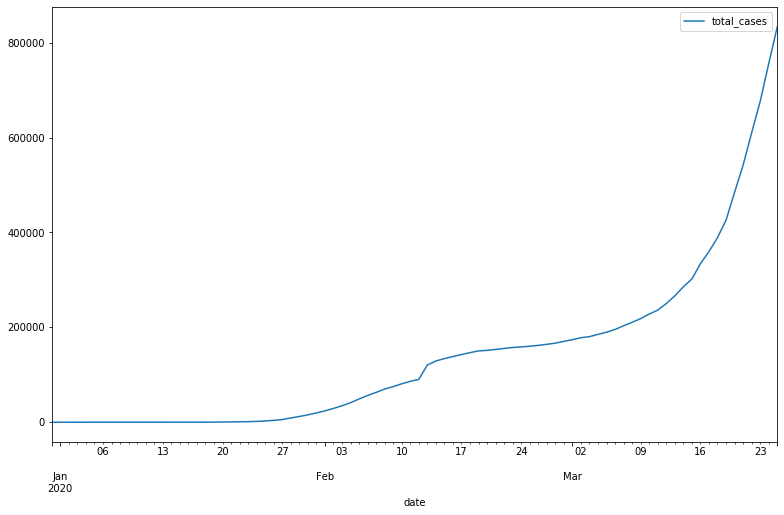

In [14]:
plot_trend_line(fd, 'total_cases')

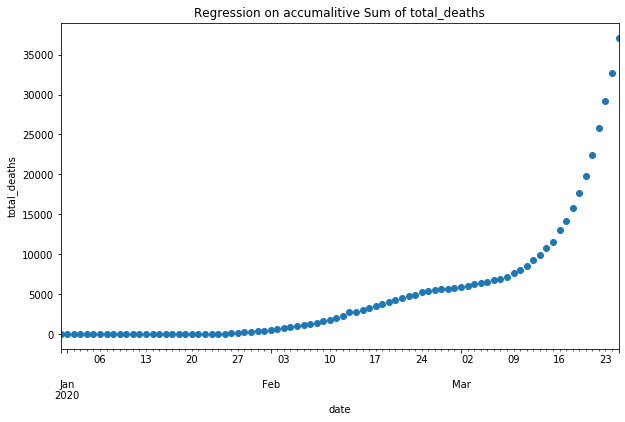

In [15]:
plot_scatter_1var(fd,'total_deaths')

Text(0.5, 1, 'Countries have more than 50000 cases')

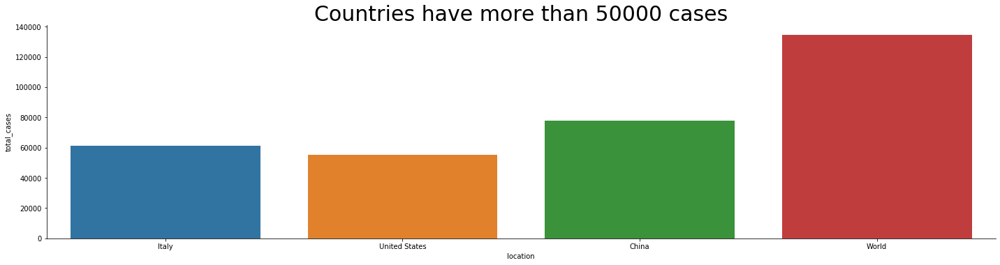

In [36]:

ax=sns.catplot(x='location',y="total_cases",data=fd[fd['total_cases']>50000].sort_values(by='total_cases'),kind='bar',aspect=4,ci=None)
plt.title('Countries have more than 50000 cases',fontsize=30)

Text(0.5, 1, 'Countries have more than 50 cases dead')

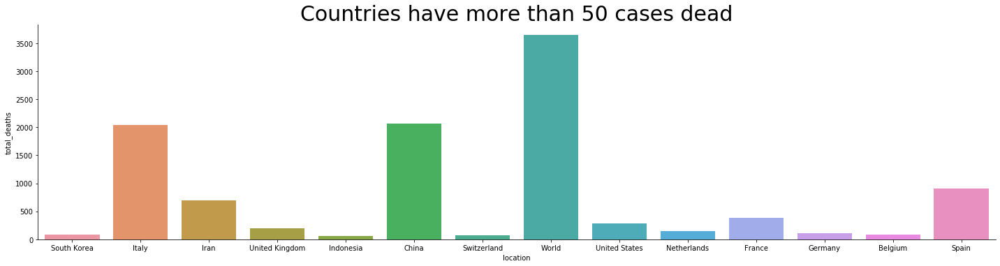

In [34]:
ax=sns.catplot(x='location',y="total_deaths",data=fd[fd['total_deaths']>=50].sort_values(by='total_deaths'),kind='bar',aspect=4,ci=None)
plt.title('Countries have more than 50 cases dead',fontsize=30)